In [2]:
import numpy as np
import matplotlib.pyplot as plt
import argparse
import yaml
import os
import sys
from pathlib import Path
import numpy as np
import torch
# Handle both direct execution and module execution     

from src.countsdiff.training.trainer import CountsdiffTrainer
from src.countsdiff.generation.generator import CountsdiffGenerator
from src.countsdiff.generation import sampling
from src.countsdiff.config.config import Config


[neptune] [warning] NeptuneDeprecationWarning: The 'neptune-client' package has been deprecated and will be removed in the future. Install the 'neptune' package instead. For more, see https://docs-legacy.neptune.ai/setup/upgrading/


In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [4]:
run_id = 'ICLR-10'
num_samples = 25
n_steps = 1000
device = 'cuda'
config = Config.load_from_neptune(run_id, project_name='countsdiff-iclr/ICLR')
# config["model"]["block_out_channels"] = [128, 256, 256, 256]
# config["model"]["class_embed_type"] = 'identity'
# config["model"]["num_classes"] = 10
if config['model']['model_type'] != '2d':
    raise ValueError("Non 2d data not supported yet")
generator = CountsdiffGenerator(run_id=run_id, legacy_model=False)
np.random.seed(42)
torch.manual_seed(42)

Connecting to Neptune run countsdiff-iclr/ICLR/ICLR-10


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/countsdiff-iclr/ICLR/e/ICLR-10
Successfully connected to Neptune
Loaded configuration from Neptune run countsdiff-iclr/ICLR/ICLR-10
[neptune] [info   ] Shutting down background jobs, please wait a moment...
[neptune] [info   ] Done!
[neptune] [info   ] Explore the metadata in the Neptune app: https://app.neptune.ai/countsdiff-iclr/ICLR/e/ICLR-10/metadata
Connecting to Neptune run countsdiff-iclr/ICLR/ICLR-10
[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/countsdiff-iclr/ICLR/e/ICLR-10
Successfully connected to Neptune
Loaded configuration from Neptune run countsdiff-iclr/ICLR/ICLR-10
[neptune] [info   ] Shutting down background jobs, please wait a moment...
[neptune] [info   ] Done!
[neptune] [info   ] Explore the metadata in the Neptune app: https://app.neptune.ai/countsdiff-iclr/ICLR/e/ICLR-10/metadata
No data_path specified in data configuration
Trainer initialized on d

In [5]:
space = torch.from_numpy(np.linspace(0, 1, 1000)).float().to(device)
p_s = generator.trainer.cosine_p_scheduler(space)
p_t = p_s[:-1]
p_s = p_s[1:]
sigma_maxes = sampling._sigma_rescaled(p_t, p_s, 0.005)

In [6]:
label = 0
first_batch = next(iter(generator.trainer.val_loader))
labels = first_batch[1][:num_samples].to(device)


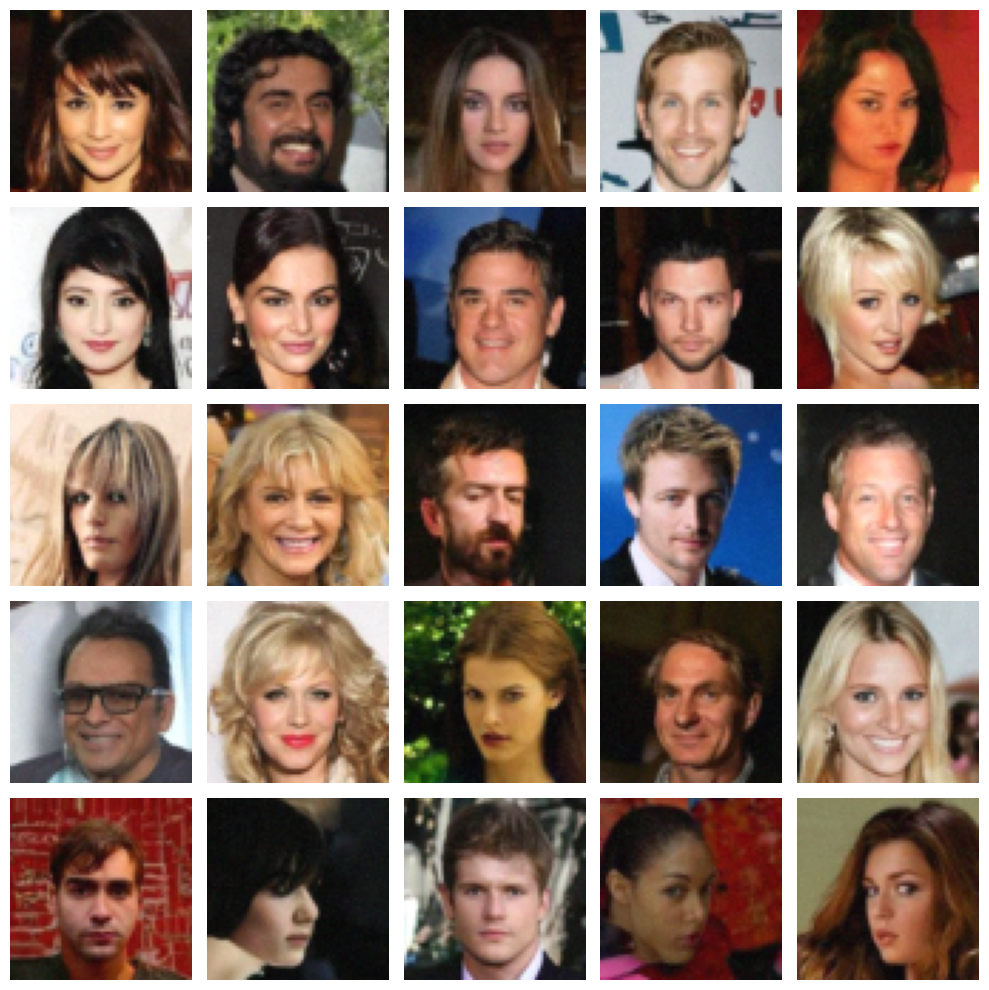

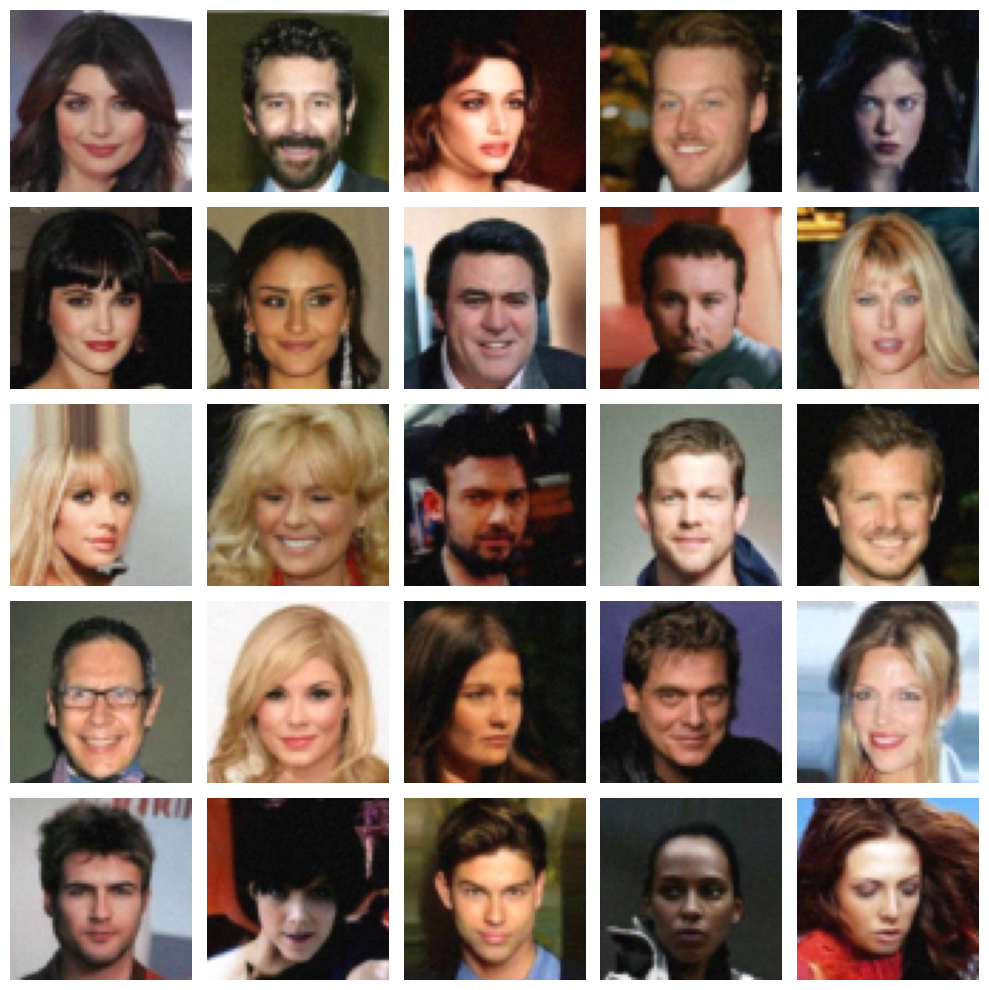

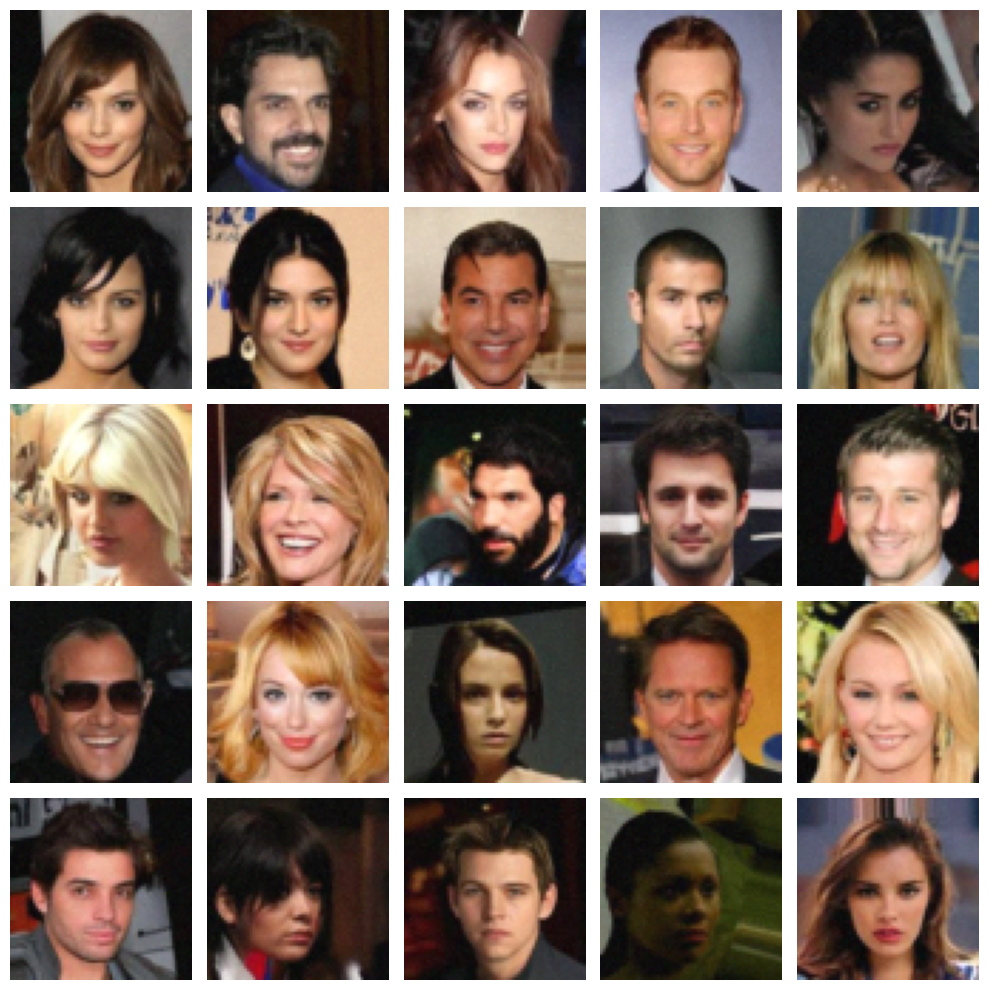

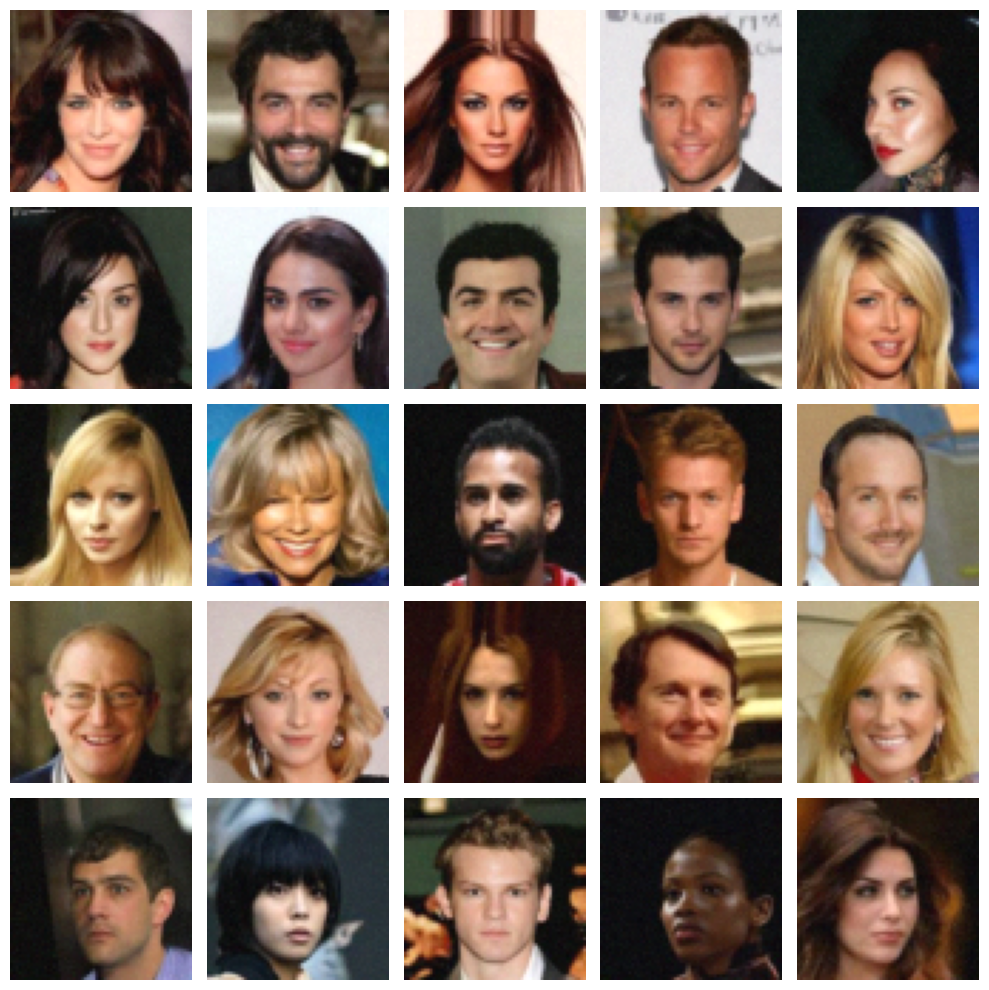

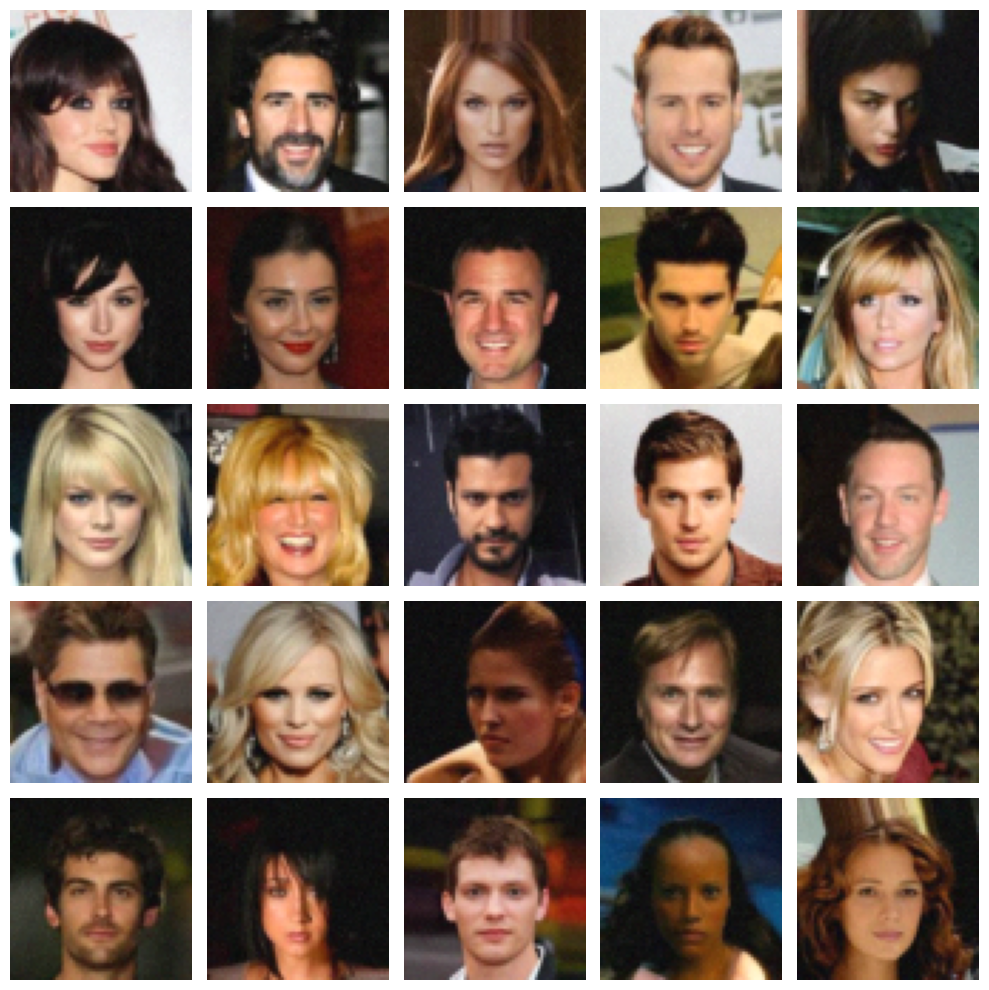

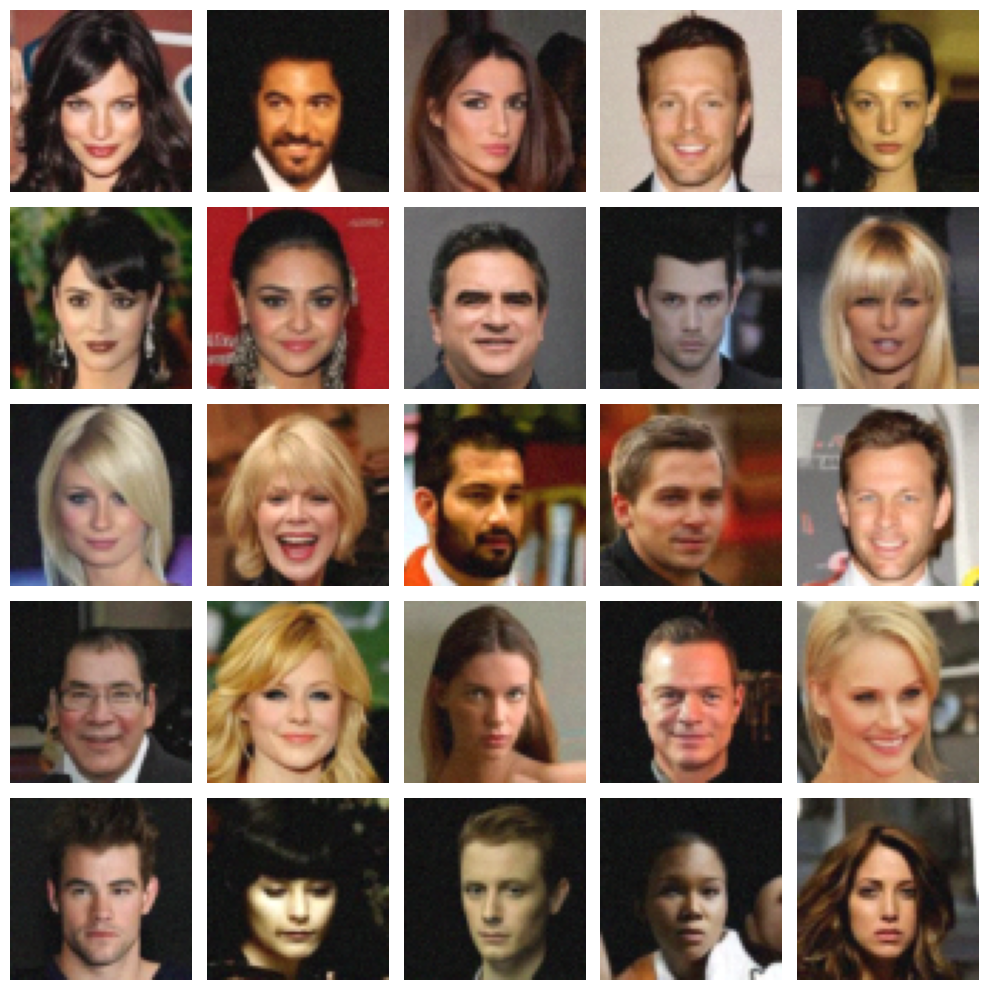

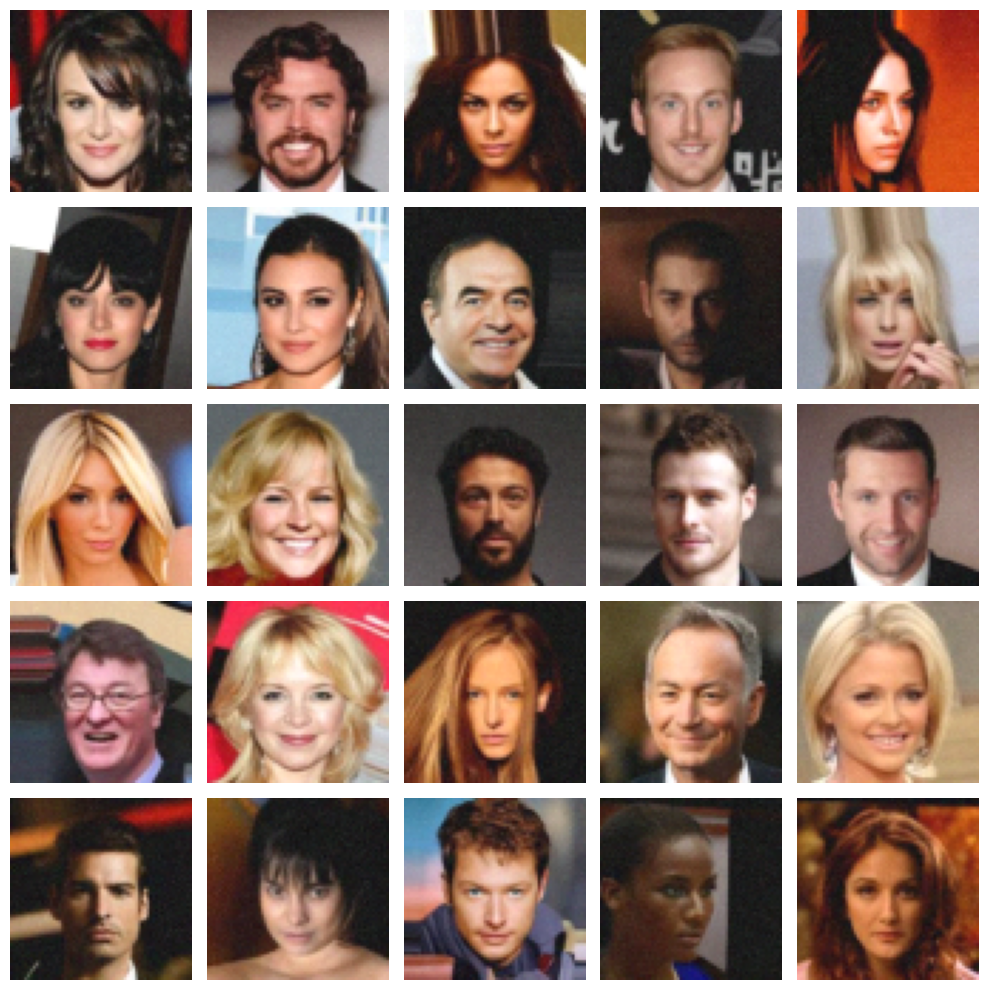

In [7]:

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.0},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()


label = 0
first_batch = next(iter(generator.trainer.val_loader))
labels = first_batch[1][:num_samples].to(device)

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.001},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

label = 0
first_batch = next(iter(generator.trainer.val_loader))
labels = first_batch[1][:num_samples].to(device)

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.002},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.005},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.01},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.02},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.05},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()
samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.075},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

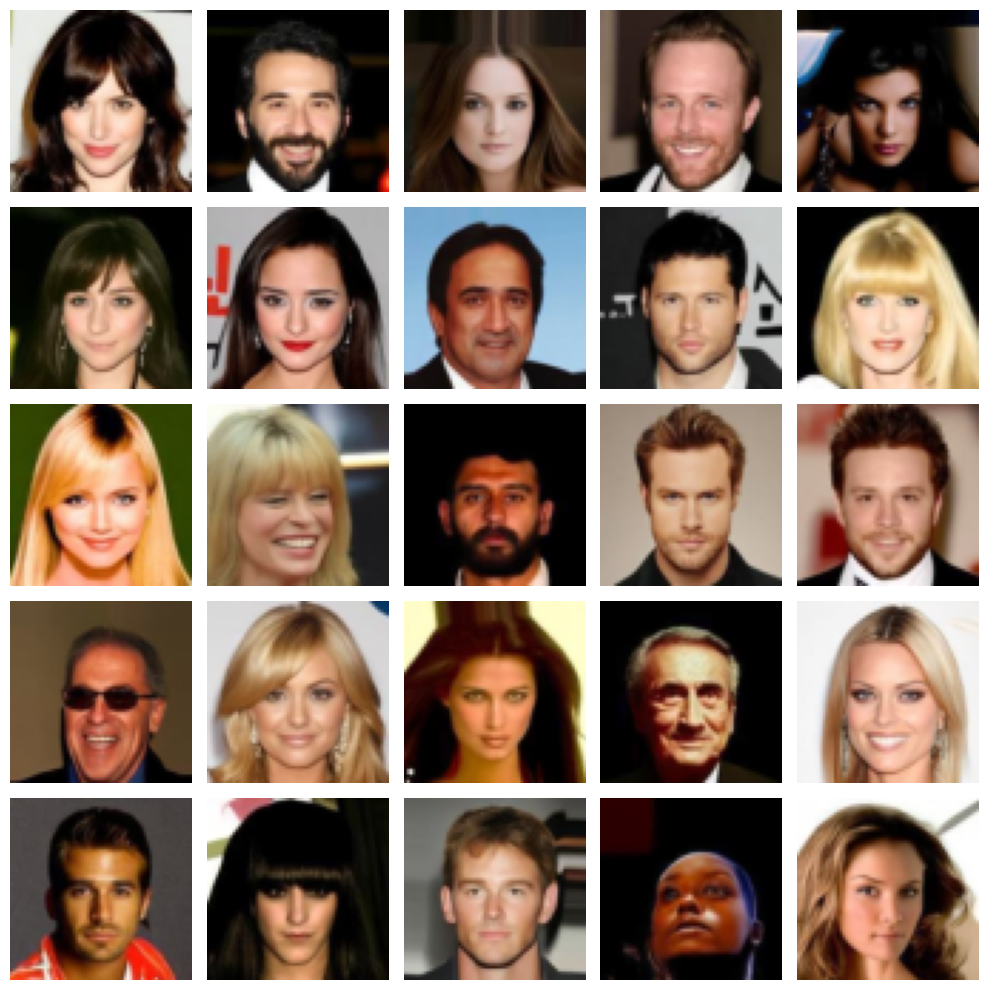

In [39]:
samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.075},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

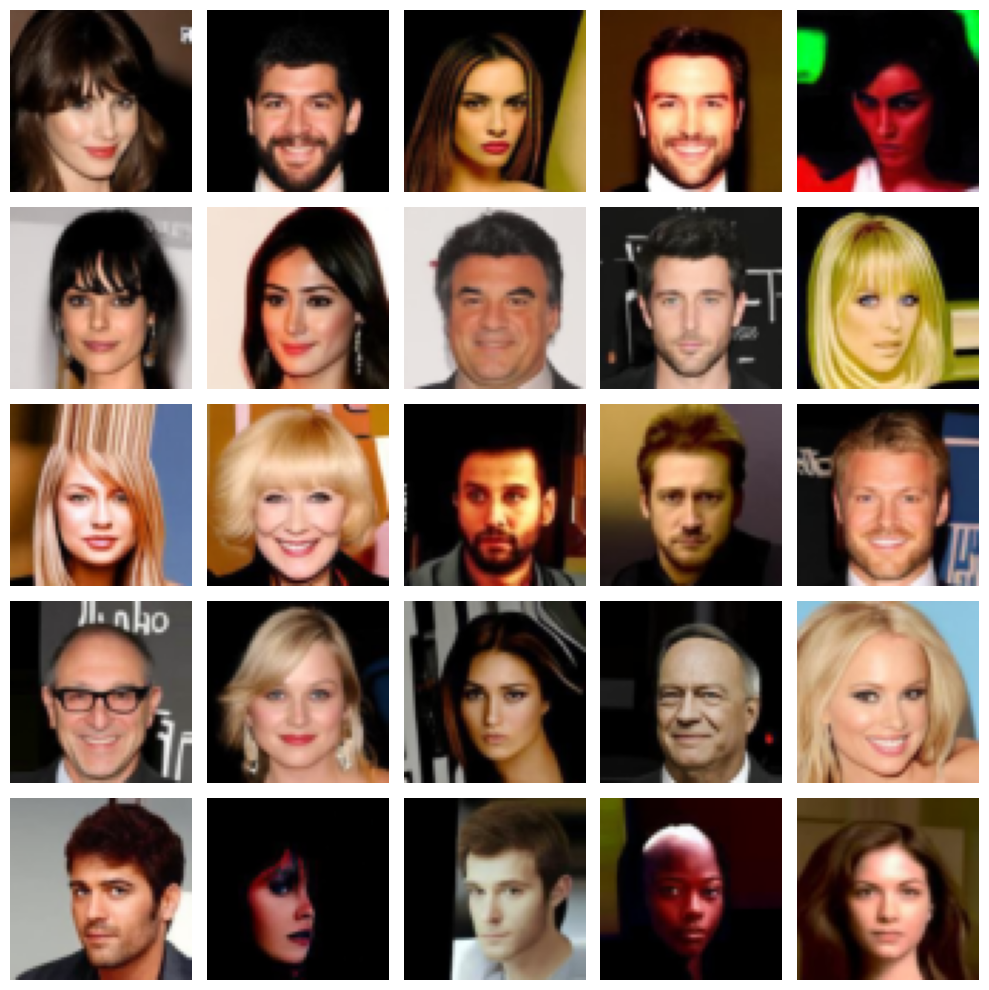

In [40]:
samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 0.1},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

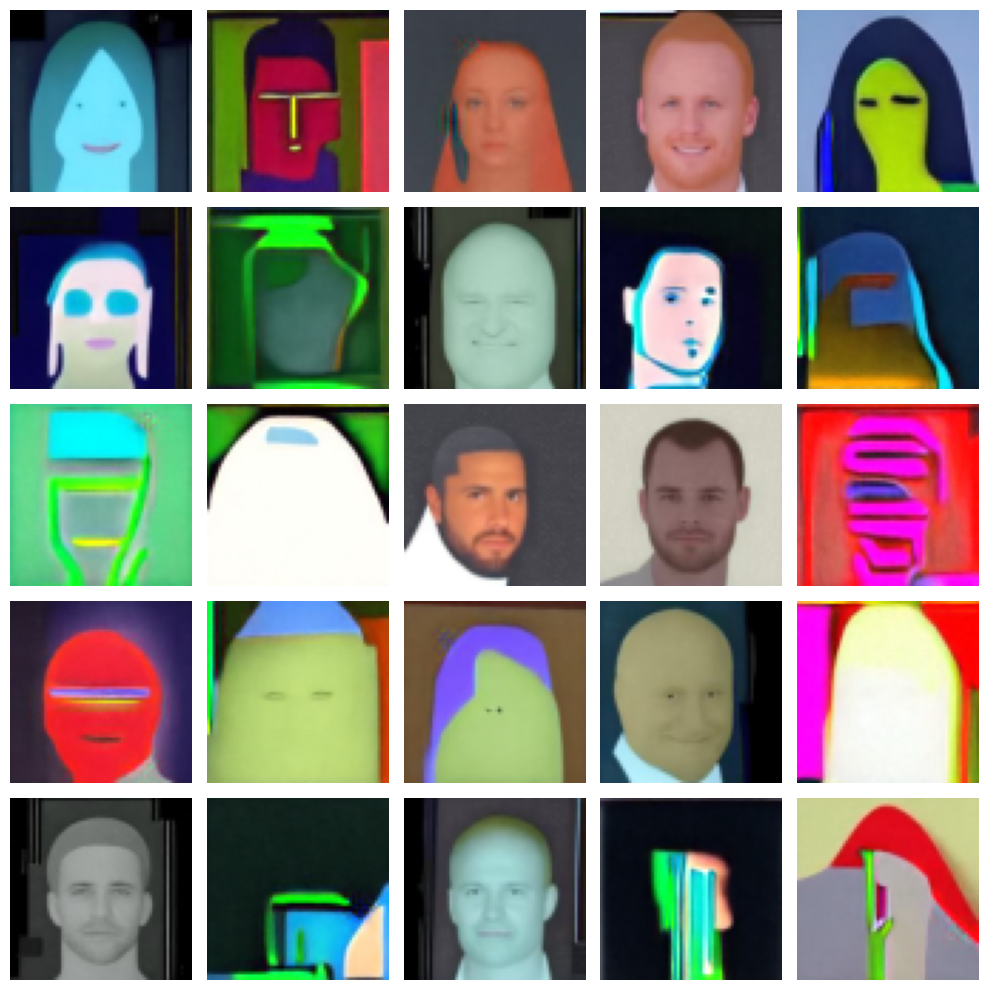

In [41]:
samples = generator.generate_samples(
    num_samples=num_samples,
    n_steps=n_steps,
    device=device,
    sigma_method='rescaled',
    sigma_kwargs={'eta_rescale': 1.0},
    verbose=True,
    labels=labels,
    guidance_scale=2.0
)
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i in range(25):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(samples[i].transpose(1, 2, 0).astype(int))
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()